# Analisis de acciones Bancolombia

# 2020-01-01 - 2020-01-01

In [1]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import yfinance as yf
import numpy as np
import datetime as dt
import warnings
import matplotlib.pyplot as plt


warnings.filterwarnings("ignore")

## 0. Introducción e importación de datos

La elección de la base de datos que abarca el periodo 2000-01-01 a 2020-01-01 para analizar las acciones de Bancolombia se justifica por la exclusión del impacto de la pandemia mundial, permitiendo un enfoque claro en factores y tendencias previas a este suceso. La extensión temporal facilita la evaluación del comportamiento de las acciones, buscando determinar si siguen una caminata aleatoria, lo que es esencial para evaluar la eficacia de estrategias de inversión basadas en análisis histórico. Además, la serie temporal presenta irregularidades en la espaciación de los datos, lo que agrega complejidad al análisis y requiere adaptación en las técnicas utilizadas para tener en cuenta la variabilidad en la frecuencia de observaciones.

In [2]:
ticker_name = 'BC'

data = yf.download(ticker_name, start='2000-01-01', end='2020-01-01')
print(data.shape)
data.head()

[*********************100%***********************]  1 of 1 completed
(5031, 6)


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,22.0000,22.09375,21.6875,21.9375,15.422194,286700
2000-01-04,21.9375,22.12500,20.8750,20.9375,14.719193,338700
2000-01-05,20.6875,21.62500,20.6875,21.0625,14.807073,214000
2000-01-06,21.1250,21.31250,20.8750,21.2500,14.938886,232700
2000-01-07,21.2500,21.62500,20.9375,21.3750,15.026756,207800


In [3]:
data.shape

(5031, 6)

In [4]:
df = pd.DataFrame()
df["Date"] = pd.to_datetime(data.index).date
df["Close"] = data["Close"].values
df.head()

,Date,Close
0,2000-01-03,21.9375
1,2000-01-04,20.9375
2,2000-01-05,21.0625
3,2000-01-06,21.2500
4,2000-01-07,21.3750


In [5]:

fig = go.Figure()
# Suponiendo que ya tienes el DataFrame df

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["Close"],
    name="NeuralProphet Forescasting",
    line=dict(color='blue', width=2)
))
fig.update_xaxes(type='category')  # Para que las fechas se muestren correctamente

# Centrar el título
fig.update_layout(title_text='Precio de acciones Bancolombia', title_x=0.5)
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1d",
                     step="day",
                     stepmode="backward"),
                dict(count=7,
                     label="1w",
                     step="day",
                     stepmode="backward"),
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=3,
                     label="3m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    ),
    yaxis=dict(
        autorange=True,
        type="linear"
    )
)

fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Price",
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=-.35
    )
)

## 1. Estabilizar varianza.


En esta sección se buscará una herramienta para estabilizar la varianza, siempre y cuando pareciera que no se encuentre estabilizada.

#### Familia de transformaciones Box-Cox:

En ocasiones la serie presenta varianza marginal no constante a lo largo del tiempo, lo cual hace necesario tener en cuenta tal característica. En este caso, se siguiere hacer una transformación de potencia para estabilizar la varianza. Esta familia de transformaciones se llaman transformaciones Box-Cox.

$$
    f_{\lambda}(u_{t})= \begin{cases}
        \lambda^{-1}(u^{\lambda}_{t}-1), &  \text{si  $u_{t} \geq 0$, para $\lambda>0$,}\\
        \ln(u_{t}), &\text{ si $u_{t}>0$, para $\lambda=0$}.
    \end{cases}
$$

note que la familia de funciones dependen del $\lambda$ escogido, pero como se escoge $\lambda$?. La respuesta es usando librerías de $R$ o Python.

**Nota**: Si el lambda calculado es muy cercano a 1, se recomienda no hacer Box-cox

In [6]:
from scipy.stats import boxcox

In [7]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import pandas as pd
import plotly.graph_objects as go
import yfinance as yf
import numpy as np
from scipy.stats import boxcox
import warnings

warnings.filterwarnings("ignore")

# Importar datos
ticker_name = 'BC'
data = yf.download(ticker_name, start='2000-01-01', end='2020-01-01')
df = pd.DataFrame()
df["Date"] = pd.to_datetime(data.index).date
df["Close"] = data["Close"].values

# Análisis Box-Cox
df['BoxCox_Close'], lambda_value = boxcox(df['Close'])  # Agregar 1 para evitar problemas con valores no positivos

fig = go.Figure()
# Suponiendo que ya tienes el DataFrame df

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["Close"],
    name="Original",
    line=dict(color='blue', width=2)
))
fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["BoxCox_Close"],
    name="Box-Cox",
    line=dict(color='green', width=2)
))
fig.update_xaxes(type='category')  # Para que las fechas se muestren correctamente

# Centrar el título
fig.update_layout(title=dict(
        text = 'Precio de acciones Bancolombia <br>' + f'Box-Cox (λ={round(lambda_value, 3)})',
        font=dict(size=20)  # Ajustar el tamaño del título
    ) , title_x=0.75)
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1d",
                     step="day",
                     stepmode="backward"),
                dict(count=7,
                     label="1w",
                     step="day",
                     stepmode="backward"),
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=3,
                     label="3m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    ),
    yaxis=dict(
        autorange=True,
        type="linear"
    )
)

fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Price",
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=-.35
    ),
    margin=dict(l=0, r=20, t=100, b=50)
)

fig.update_layout(
    xaxis=dict(title=dict(font=dict(size=20))),
    yaxis=dict(title=dict(font=dict(size=20))),
    legend=dict(font=dict(size=17))
)



[*********************100%***********************]  1 of 1 completed


## 2. Análisis de la tendencia y eliminación:

Los procedimientos que permiten estimar y extraer los componentes de tendencia y/o estacionalidad se conoce como **suavizamiento**.


### 2.1. Promedio móvil :

El promedio móvil es un método útil para descubrir ciertos rasgos en una serie de tiempo, como **tendencias a largo plazo y componentes estacionales**. En particular, si $x_t$ representa las observaciones, entonces una forma de predecir o estimar la tendencia de la serie es:

$$m_t=\sum_{j=-k}^{k}a_jx_{t-j},$$ 

donde si $a_j=a_{-j}\geq 0$ y $\sum_{j=-k}^{k}a_j=1$ se conoce como el promedio móvil simétrico de los datos.


In [8]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import datetime as dt
import warnings
import matplotlib.pyplot as plt
from scipy.stats import boxcox
import yfinance as yf
from scipy import stats

warnings.filterwarnings("ignore")

# Importar datos
ticker_name = 'BC'
data = yf.download(ticker_name, start='2000-01-01', end='2020-01-01')
df = pd.DataFrame()
df["Date"] = pd.to_datetime(data.index).date
df["Close"] = data["Close"].values

# Análisis Box-Cox
df['BoxCox_Close'], lambda_value = boxcox(df['Close'])  # Agregar 1 para evitar problemas con valores no positivos

# Agregar columnas de promedios móviles (SMA) con ventanas de 10, 50, 100, 200, 500 y 1000 días
df['SMA_10'] = df['BoxCox_Close'].rolling(window=10).mean()
df['SMA_50'] = df['BoxCox_Close'].rolling(window=50).mean()
df['SMA_100'] = df['BoxCox_Close'].rolling(window=100).mean()
df['SMA_200'] = df['BoxCox_Close'].rolling(window=200).mean()
df['SMA_500'] = df['BoxCox_Close'].rolling(window=500).mean()
df['SMA_1000'] = df['BoxCox_Close'].rolling(window=1000).mean()

# Crear gráfico
fig = go.Figure()

# Suponiendo que ya tienes el DataFrame df

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["BoxCox_Close"],
    name="Box-Cox",
    line=dict(color='green', width=2)
))

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["SMA_10"],
    name="SMA (10 days)",
    line=dict(color='orange', width=2)
))

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["SMA_50"],
    name="SMA (50 days)",
    line=dict(color='red', width=2)
))

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["SMA_100"],
    name="SMA (100 days)",
    line=dict(color='purple', width=2)
))

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["SMA_200"],
    name="SMA (200 days)",
    line=dict(color='blue', width=2)
))

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["SMA_500"],
    name="SMA (500 days)",
    line=dict(color='pink', width=2)
))

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["SMA_1000"],
    name="SMA (1000 days)",
    line=dict(color='cyan', width=2)
))

fig.update_xaxes(type='category')  # Para que las fechas se muestren correctamente

# Centrar el título
fig.update_layout(title_text='Precio de acciones Bancolombia con SMAs', title_x=0.5)
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1d",
                     step="day",
                     stepmode="backward"),
                dict(count=7,
                     label="1w",
                     step="day",
                     stepmode="backward"),
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=3,
                     label="3m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    ),
    yaxis=dict(
        autorange=True,
        type="linear"
    )
)

fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Price",
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=-.35
    )
)





[*********************100%***********************]  1 of 1 completed


### 2.2 Suavisamiento Kernel

El suavizamiento kernel es un suavizador de promedio móvil que utiliza una función de ponderación, o kernel, para promediar las observaciones.Veamos ahora como queda el promedio móvil:

$$m_t= \sum_{i=1}^n \omega_i(t)x_i$$
donde, 
$$w_i(t)=K(\frac{t-i}{b})/\sum_{j=1}^{n}K(\frac{t-j}{b})$$

son los pesos y $K(\cdot)$ es una función kernel.

In [9]:
from scipy.ndimage import gaussian_filter1d


df['Smoothed_BoxCox_1'] = gaussian_filter1d(df['BoxCox_Close'], sigma=1)
df['Smoothed_BoxCox_10'] = gaussian_filter1d(df['BoxCox_Close'], sigma=10)
df['Smoothed_BoxCox_100'] = gaussian_filter1d(df['BoxCox_Close'], sigma=100)
df['Smoothed_BoxCox_200'] = gaussian_filter1d(df['BoxCox_Close'], sigma=200)

# Crear gráfico
fig = go.Figure()

# Suponiendo que ya tienes el DataFrame df

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["BoxCox_Close"],
    name="Box-Cox",
    line=dict(color='green', width=2)
))

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["Smoothed_BoxCox_1"],
    name="Kernel (σ=1)",
    line=dict(color='orange', width=2)
))
fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["Smoothed_BoxCox_10"],
    name="Kernel (σ=10)",
    line=dict(color='red', width=2)
))
fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["Smoothed_BoxCox_100"],
    name="Kernel (σ=100)",
    line=dict(color='purple', width=2)
))
fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["Smoothed_BoxCox_200"],
    name="Kernel (σ=0)",
    line=dict(color='blue', width=2)
))


fig.update_xaxes(type='category')  # Para que las fechas se muestren correctamente

# Centrar el título
fig.update_layout(title_text='Precio de acciones Bancolombia con Suavisamiento Kernel', title_x=0.5)
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1d",
                     step="day",
                     stepmode="backward"),
                dict(count=7,
                     label="1w",
                     step="day",
                     stepmode="backward"),
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=3,
                     label="3m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    ),
    yaxis=dict(
        autorange=True,
        type="linear"
    )
)

fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Price",
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=-.35
    )
)



### 2.3 Loess o Lowess

Otro enfoque para suavizar un gráfico de tiempo es la regresión del vecino más cercano. La técnica se basa en la regresión de k vecinos más cercanos, en la que uno usa solo los datos $\{x_{t−k/2}, ..., x_t, ..., x_{t+k/2}\}$ para predecir $x_t$ mediante regresión, y luego establece $m_t = \hat{x}_t$. Primero, una cierta proporción de vecinos más cercanos a $x_t$ se incluyen en un esquema de ponderación; los valores más cercanos a $x_t$ en el tiempo obtienen más peso. Luego, se utiliza una regresión ponderada robusta para predecir $x_t$ y obtener los valores suavizados $m_t$. Cuanto mayor sea la fracción de vecinos más cercanos incluidos, más suave será el ajuste. 

In [10]:
import dash
from dash import dcc, html
import pandas as pd
import plotly.graph_objects as go
import yfinance as yf
from scipy.stats import boxcox
from statsmodels.nonparametric.smoothers_lowess import lowess
import warnings
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["BoxCox_Close"],
    name="Box-Cox",
    line=dict(color='green', width=2)
))

frac = 0.075  # Puedes seleccionar el valor de frac que desees
smoothed_values = lowess(df['BoxCox_Close'], df.index, frac=frac, it=0)

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=smoothed_values[:, 1],
    name=f"Smoothed (frac={frac})",
    line=dict(width=2)
))

trend_removed = df['BoxCox_Close'] - smoothed_values[:, 1]

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=trend_removed,
    name="Trend Removed",
    line=dict(width=2)
))

# Configuración del diseño del gráfico
fig.update_xaxes(type='category')  # Para que las fechas se muestren correctamente
fig.update_layout(
    title_text=f'Eliminación de tendencia Lowess con frac = {frac}',
    title_x=0.5,
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1d",
                     step="day",
                     stepmode="backward"),
                dict(count=7,
                     label="1w",
                     step="day",
                     stepmode="backward"),
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=3,
                     label="3m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    ),
    yaxis=dict(
        autorange=True,
        type="linear"
    ),
    xaxis_title="Date",
    yaxis_title="Values",
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=-.35
    )
)

### 2.4 Suavizamiento Splines

Una forma obvia de suavizar los datos sería ajustar una regresión polinomial en términos del tiempo. Por ejemplo, un polinomio cúbico tendría $x_t = m_t + w_t$ donde $m_t =\beta_0 + \beta_1t + \beta_2t^2 + \beta_3t^3$. Entonces podríamos ajustar $m_t$ mediante mínimos cuadrados ordinarios.

Una extensión de la regresión polinomial es dividir primero el tiempo $t = 1,. . . , n$, en k intervalos, $[t_0 = 1, t_1]$, $[t_1 + 1, t_2],\cdots,$ $[t_{k − 1} + 1, t_k = n]$; los valores $t_0$, $t_1$, …, $t_k$ se llaman nodos. Luego, en cada intervalo, se ajusta una regresión polinomial, normalmente de orden 3, y esto se llama splines cúbicos. Un método relacionado es suavizar splines, que minimiza el compromiso entre el ajuste y el grado de suavidad dado por

$$\sum_{t=1}^{n}[x_t-m_t]^2+\lambda\int(m_t'')^2 dt,$$

donde $m_t$ es un spline cúbico con nodos en cada tiempo t y el grado de suavidad es controlado por $\lambda>0.$ 

In [11]:
from scipy.interpolate import UnivariateSpline


fig3 = go.Figure()

fig3.add_trace(go.Scatter(
    x=df["Date"],
    y=df["BoxCox_Close"],
    name="Box-Cox Original",
    line=dict(color='green', width=2)
))

fig3.update_xaxes(type='category')  # Para que las fechas se muestren correctamente

# Centrar el título
fig3.update_layout(title_text='Precio de acciones Bancolombia - Box-Cox Original', title_x=0.5)
fig3.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1d",
                     step="day",
                     stepmode="backward"),
                dict(count=7,
                     label="1w",
                     step="day",
                     stepmode="backward"),
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=3,
                     label="3m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    ),
    yaxis=dict(
        autorange=True,
        type="linear"
    )
)

fig3.update_layout(
    xaxis_title="Date",
    yaxis_title="Price",
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=-.35
    )
)

# Aplicar suavizado con splines para diferentes valores de k
k_values = [1, 2, 3, 4, 5]
colors = ['blue', 'orange', 'red', 'purple', 'cyan']

for k, color in zip(k_values, colors):
    spl = UnivariateSpline(df.index, df['BoxCox_Close'], k=k)
    df[f'Spline_Close_{k}'] = spl(df.index)

    fig3.add_trace(go.Scatter(
        x=df["Date"],
        y=df[f"Spline_Close_{k}"],
        name=f"Spline k={k}",
        line=dict(color=color, width=2)
    ))



### 2.5  Descomposición Promedios Moviles

In [12]:
import dash
from dash import dcc, html
import pandas as pd
import plotly.graph_objects as go
import yfinance as yf
import statsmodels.api as sm
from scipy.stats import boxcox
from plotly.subplots import make_subplots

# Descargar datos
ticker_name = 'BC'
data = yf.download(ticker_name, start='2000-01-01', end='2020-01-01')
df = pd.DataFrame()
df["Date"] = pd.to_datetime(data.index).date
df["Close"] = data["Close"].values

# Aplicar transformación Box-Cox
df['BoxCox_Close'], lambda_value = boxcox(df['Close'] + 1)  # Se suma 1 para evitar logaritmo de cero

# Descomposición usando promedio móvil y STL
result = sm.tsa.seasonal_decompose(df['BoxCox_Close'], period=252)  # 252 días en un año bursátil

# Crear una figura con subgráficas
fig4 = make_subplots(rows=4, cols=1, shared_xaxes=True, vertical_spacing=0.05)

# Subgráfica 1: Serie original
fig4.add_trace(go.Scatter(
    x=df["Date"],
    y=df["BoxCox_Close"],
    name="Box-Cox Original",
    line=dict(color='green', width=2)
), row=1, col=1)

# Subgráfica 2: Tendencia
fig4.add_trace(go.Scatter(
    x=df["Date"],
    y=result.trend,
    name="Tendencia",
    line=dict(color='blue', width=2)
), row=2, col=1)

# Subgráfica 3: Estacionalidad
fig4.add_trace(go.Scatter(
    x=df["Date"],
    y=result.seasonal,
    name="Estacionalidad",
    line=dict(color='red', width=2)
), row=3, col=1)

# Subgráfica 4: Residuos
fig4.add_trace(go.Scatter(
    x=df["Date"],
    y=result.resid,
    name="Residuos",
    line=dict(color='purple', width=2)
), row=4, col=1)

# Ajustes de diseño
fig4.update_layout(title_text='Descomposición de acciones Bancolombia por Promedios Moviles', title_x=0.5)

fig4.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1d",
                     step="day",
                     stepmode="backward"),
                dict(count=7,
                     label="1w",
                     step="day",
                     stepmode="backward"),
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=3,
                     label="3m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        type="date"
    ),
    yaxis=dict(
        autorange=True,
        type="linear"
    )
)

# Configurar un rango selector único para todos los subgráficos
fig4.update_xaxes(rangeslider=dict(visible=True), row=4, col=1)




[*********************100%***********************]  1 of 1 completed


### 2.6  Descomposición STL

STL son las iniciales de "Seasonal and Trend decomposition using Loess",el cual fue desarrollado por R. B. Cleveland et al. (1990).

Note que se obliga a extraer un componente estacional, sin embargo puede que está componente en verdad no exista, por eso se debe verificar que en efecto hay.

In [13]:
from statsmodels.tsa.seasonal import STL
from plotly.subplots import make_subplots

# Descomposición usando STL
stl = STL(df['BoxCox_Close'], seasonal=13, period=252)
result = stl.fit()

# Crear una figura con subgráficas
fig5 = make_subplots(rows=4, cols=1, shared_xaxes=True, vertical_spacing=0.05)

# Subgráfica 1: Serie original
fig5.add_trace(go.Scatter(
    x=df["Date"],
    y=df["Close"],
    name="Original",
    line=dict(color='green', width=2)
), row=1, col=1)

# Subgráfica 2: Tendencia
fig5.add_trace(go.Scatter(
    x=df["Date"],
    y=result.trend,
    name="Tendencia",
    line=dict(color='blue', width=2)
), row=2, col=1)

# Subgráfica 3: Estacionalidad
fig5.add_trace(go.Scatter(
    x=df["Date"],
    y=result.seasonal,
    name="Estacionalidad",
    line=dict(color='red', width=2)
), row=3, col=1)

# Subgráfica 4: Residuos
fig5.add_trace(go.Scatter(
    x=df["Date"],
    y=result.resid,
    name="Residuos",
    line=dict(color='purple', width=2)
), row=4, col=1)

# Ajustes de diseño
fig5.update_layout(title_text='Descomposición de acciones Bancolombia con STL', title_x=0.5)

# Configurar un rango selector único para todos los subgráficos
fig5.update_xaxes(rangeslider=dict(visible=True), row=4, col=1)


# 3. Analisis

## 3.1 Lowess

In [19]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=df["BoxCox_Close"],
    name="Box-Cox",
    line=dict(color='green', width=2)
))

frac = 0.075  # Puedes seleccionar el valor de frac que desees
smoothed_values = lowess(df['BoxCox_Close'], df.index, frac=frac, it=0)

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=smoothed_values[:, 1],
    name=f"Smoothed (frac={frac})",
    line=dict(width=2)
))

trend_removed = df['BoxCox_Close'] - smoothed_values[:, 1]

fig.add_trace(go.Scatter(
    x=df["Date"],
    y=trend_removed,
    name="Trend Removed",
    line=dict(width=2)
))

# Configuración del diseño del gráfico
fig.update_xaxes(type='category')  # Para que las fechas se muestren correctamente
fig.update_layout(
    title_text=f'Eliminación de tendencia Lowess con frac = {frac}',
    title_x=0.5,
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1d",
                     step="day",
                     stepmode="backward"),
                dict(count=7,
                     label="1w",
                     step="day",
                     stepmode="backward"),
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=3,
                     label="3m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    ),
    yaxis=dict(
        autorange=True,
        type="linear"
    ),
    xaxis_title="Date",
    yaxis_title="Values",
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=-.35
    )
)

## 3.2 Diferencia ordinaria

Apliquemos una diferencia ordinaria de orden 1 a la serie

$$
\nabla^1 Y_t=(1-B)^1 Y_t=Y_t-Y_{t-1}
$$

In [14]:
df['Close_diff'] = df['BoxCox_Close'].diff()

fig6 = go.Figure()

fig6.add_trace(go.Scatter(
    x=df["Date"],
    y=df["BoxCox_Close"],
    name="Box-Cox Original",
    line=dict(color='green', width=2)
))
fig6.add_trace(go.Scatter(
    x=df["Date"],
    y=df["Close_diff"],
    name="Diferencia Ordinaria",
    line=dict(color='orange', width=2)
))

fig6.update_xaxes(type='category')  # Para que las fechas se muestren correctamente

# Centrar el título
fig6.update_layout(title_text='Precio de acciones Bancolombia - Box-Cox Original', title_x=0.5)
fig6.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1d",
                     step="day",
                     stepmode="backward"),
                dict(count=7,
                     label="1w",
                     step="day",
                     stepmode="backward"),
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=3,
                     label="3m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    ),
    yaxis=dict(
        autorange=True,
        type="linear"
    )
)

fig6.update_layout(
    xaxis_title="Date",
    yaxis_title="Price",
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=-.35
    )
)

## 2.7 Diagrama de dispersión para la variable y sus retardos:

Vamos a hacer gráficos de dispersión para chequear que tipos de relaciones hay entre los retardos de la variable interés. Esto permite chequear si hay posibles relaciones no-lineales.

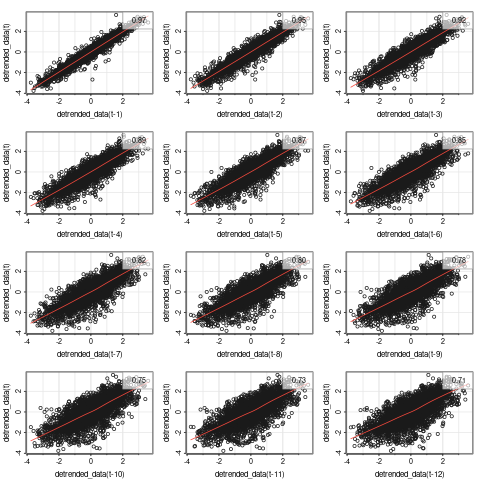

In [20]:
from PIL import Image
pil_image = Image.open("../img/lag_detrend_lowess.jpg")
pil_image

# 4. Estacionalidad

## 4.1 Box plot Día de la semana

In [1]:
import seaborn as sns
import calendar
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from scipy.ndimage import gaussian_filter1d
import statsmodels.api as sm
from statsmodels.nonparametric.smoothers_lowess import lowess
from scipy.stats import boxcox
import yfinance as yf
import matplotlib.pyplot as plt
import base64
from PIL import Image

# Importar datos
ticker_name = 'BC'
data = yf.download(ticker_name, start='2000-01-01', end='2020-01-01')
df = pd.DataFrame()
df["Date"] = data.index
df["Close"] = data["Close"].values

# Análisis Box-Cox
df['BoxCox_Close'], lambda_value = boxcox(df['Close'])
frac = 0.075
smoothed_values = lowess(df['BoxCox_Close'], df.index, frac=frac, it=0)
trend_removed = df['BoxCox_Close'] - smoothed_values[:, 1]

df['Trend_Removed'] = trend_removed

# Crear una nueva columna para el nombre del día de la semana
df['Day_Name'] = df['Date'].dt.day_name()

# Crear el box plot utilizando plotly.express
fig = px.box(df, x='Day_Name', y='Trend_Removed', title='Box Plot de trend_removed por Día de la Semana', labels={'Trend_Removed': 'Trend Removed'})
fig.update_layout(title_text='Box Plot por Día de la Semana', title_x=0.5)
fig.show()


/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


[*********************100%***********************]  1 of 1 completed


## 4.2 Grafica día del mes

In [2]:
df['Day_Of_Month'] = df['Date'].dt.day

# Calcular la mediana y el intervalo de confianza por día del mes
median_ci_by_day = df.groupby('Day_Of_Month')['Trend_Removed'].quantile([0.025, 0.5, 0.975]).unstack().reset_index()
median_ci_by_day.columns = ['Day_Of_Month', 'lower', 'median', 'upper']

# Crear el gráfico de la mediana y el intervalo de confianza
fig_median = go.Figure()
fig_median.add_trace(go.Scatter(x=median_ci_by_day['Day_Of_Month'], y=median_ci_by_day['median'], mode='lines', name='Median'))
fig_median.add_trace(go.Scatter(x=median_ci_by_day['Day_Of_Month'], y=median_ci_by_day['lower'], mode='lines', line=dict(dash='dash')))
fig_median.add_trace(go.Scatter(x=median_ci_by_day['Day_Of_Month'], y=median_ci_by_day['upper'], mode='lines', line=dict(dash='dash')))
fig_median.update_layout(
    title=dict(
        text='Mediana por Día del Mes',
        x=0.5
    ),
    xaxis_title='Día del Mes'
)
# Mostrar el gráfico
fig_median.show()


## 4.3 Media del Año 

In [4]:
df['Day_Of_Year'] = df['Date'].dt.dayofyear

# Calcular la mediana y el intervalo de confianza por día del año
median_year = df.groupby('Day_Of_Year')['Trend_Removed'].quantile([0.025, 0.5, 0.975]).unstack().reset_index()
median_year.columns = ['Day_Of_Year', 'lower', 'median', 'upper']

# Crear el gráfico de la mediana y el intervalo de confianza
fig_median_year = go.Figure()
fig_median_year.add_trace(go.Scatter(x=median_year['Day_Of_Year'], y=median_year['median'], mode='lines', name='Median'))
fig_median_year.add_trace(go.Scatter(x=median_year['Day_Of_Year'], y=median_year['lower'], mode='lines', line=dict(dash='dash')))
fig_median_year.add_trace(go.Scatter(x=median_year['Day_Of_Year'], y=median_year['upper'], mode='lines', line=dict(dash='dash')))
fig_median_year.update_layout(
    title=dict(
        text='Mediana por Día del Año',
        x=0.5
    ),
    xaxis_title='Día del Año'
)
# Mostrar el gráfico
fig_median_year.show()


## 4.4 Box plot Mes del año

In [3]:
import calendar
import plotly.express as px

# Crear una nueva columna para el nombre del mes
df['Month_Name'] = df['Date'].dt.month_name()

# Crear el box plot utilizando plotly.express
fig1 = px.box(df, x='Month_Name', y='Trend_Removed', title='Box Plot de trend_removed por Mes', labels={'Trend_Removed': 'Trend Removed'})
fig1.update_layout(title_text='Box Plot por Mes', title_x=0.5)
fig1.show()


# 5. Modelado

## 5.1 Modelación por suavizamiento exponencial

In [1]:
import pandas as pd
import yfinance as yf
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
import plotly.graph_objs as go

# Descargar datos
ticker_name = 'BC'
data = yf.download(ticker_name, start='2000-01-01', end='2020-01-01')

# Crear DataFrame
df = pd.DataFrame()
df["Date"] = data.index
df["Close"] = data["Close"].values

# Dividir en conjunto de entrenamiento y prueba
train_size = int(len(df) * 0.9)  # 80% para entrenamiento
train, test = df[:train_size], df[train_size:]

# Definir diferentes valores de suavizamiento (alpha)
alphas = [0.2, 0.5, 0.8]

# Predicciones para datos de entrenamiento y prueba con diferentes valores de suavizamiento
preds_train = {}
preds_test = {}

for alpha in alphas:
    # Modelo de suavizado exponencial simple
    model = SimpleExpSmoothing(train["Close"]).fit(smoothing_level=alpha, optimized=False)
    
    # Predicciones para datos de entrenamiento
    preds_train[alpha] = model.fittedvalues
    
    # Predicciones para datos de prueba
    preds_test[alpha] = model.forecast(len(test))

# Visualizar las predicciones y los datos reales con Plotly
fig_simple = go.Figure()

# Datos de entrenamiento
for alpha, preds in preds_train.items():
    fig_simple.add_trace(go.Scatter(x=train["Date"], y=preds, mode='lines', name=f'Train (alpha={alpha})'))

# Datos de prueba
for alpha, preds in preds_test.items():
    fig_simple.add_trace(go.Scatter(x=test["Date"], y=preds, mode='lines', name=f'Test (alpha={alpha})'))

fig_simple.add_trace(go.Scatter(x=train["Date"], y=train["Close"], mode='lines', name='Train', line=dict(color='black')))
fig_simple.add_trace(go.Scatter(x=test["Date"], y=test["Close"], mode='lines', name='Test', line=dict(color='red')))

fig_simple.update_layout(title="Predicciones con Suavizado Exponencial Simple (diferentes alphas)",
                  xaxis_title="Fecha",
                  yaxis_title="Precio de cierre")

fig_simple.show()


/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


[*********************100%***********************]  1 of 1 completed


In [2]:
from statsmodels.tsa.holtwinters import Holt

In [3]:
fit1 = Holt(train["Close"], initialization_method="estimated").fit(smoothing_level=0.8, smoothing_trend=0.2, optimized=False)
fcast1 = fit1.forecast(len(test) + 5).rename("Holt's linear trend")

fit2 = Holt(train["Close"], exponential=True, initialization_method="estimated").fit(smoothing_level=0.8, smoothing_trend=0.2, optimized=False)
fcast2 = fit2.forecast(len(test) + 5).rename("Exponential trend")

fit3 = Holt(train["Close"], damped_trend=True, initialization_method="estimated").fit(smoothing_level=0.8, smoothing_trend=0.2)
fcast3 = fit3.forecast(len(test) + 5).rename("Additive damped trend")

# Visualizar las predicciones y los datos reales con Plotly
fig_Holt = go.Figure()

# Datos de entrenamiento
fig_Holt.add_trace(go.Scatter(x=train["Date"], y=fit1.fittedvalues, mode='lines', name="Holt's linear trend"))
fig_Holt.add_trace(go.Scatter(x=train["Date"], y=fit2.fittedvalues, mode='lines', name="Exponential trend"))
fig_Holt.add_trace(go.Scatter(x=train["Date"], y=fit3.fittedvalues, mode='lines', name="Additive damped trend"))

# Predicciones a partir de la fecha de prueba
test_dates = pd.date_range(start=test["Date"].iloc[0], periods=len(test) + 5)

for i, (fcast, method) in enumerate(zip([fcast1, fcast2, fcast3], ["Holt's linear trend", "Exponential trend", "Additive damped trend"]), start=1):
    fig_Holt.add_trace(go.Scatter(x=test_dates, y=fcast, mode='lines', name=f"Forecast {i} ({method})"))

fig_Holt.add_trace(go.Scatter(x=train["Date"], y=train["Close"], mode='lines', name='Train', line=dict(color='black')))
fig_Holt.add_trace(go.Scatter(x=test["Date"], y=test["Close"], mode='lines', name='Test', line=dict(color='red')))

fig_Holt.update_layout(title="Predicciones con Holt (diferentes configuraciones)",
                  xaxis_title="Fecha",
                  yaxis_title="Precio de cierre")

fig_Holt.show()

In [4]:


# Ajustar modelos
fit1 = SimpleExpSmoothing(df["Close"], initialization_method="estimated").fit()
fit2 = Holt(df["Close"], initialization_method="estimated").fit()
fit3 = Holt(df["Close"], exponential=True, initialization_method="estimated").fit()
fit4 = Holt(df["Close"], damped_trend=True, initialization_method="estimated", ).fit(damping_trend=0.98)
fit5 = Holt(df["Close"], exponential=True, damped_trend=True, initialization_method="estimated").fit()


# Crear la tabla de resultados
results = pd.DataFrame(
    index=[r'$\alpha$', r'$\beta$', r'$\phi$', r'$l_0$', '$b_0$', 'MSE'],
    columns=["SES", "Holt's", "Exponential", "Additive", "Multiplicative"],
)
params = ['smoothing_level', 'smoothing_trend', 'damping_trend', 'initial_level', 'initial_trend']

results["SES"] =            [round(fit1.params[p], 3) for p in params] + [round(fit1.sse, 3)]
results["Holt's"] =         [round(fit2.params[p], 3) for p in params] + [round(fit2.sse, 3)]
results["Exponential"] =    [round(fit3.params[p], 3) for p in params] + [round(fit3.sse, 3)]
results["Additive"] =       [round(fit4.params[p], 3) for p in params] + [round(fit4.sse, 3)]
results["Multiplicative"] = [round(fit5.params[p], 3) for p in params] + [round(fit5.sse, 3)]

# Mostrar la tabla
results

,SES,Holt's,Exponential,Additive,Multiplicative
$\alpha$,1.000,1.000,1.000,1.000,1.000
$\beta$,NaN,0.000,0.000,0.000,0.000
$\phi$,NaN,NaN,NaN,0.980,0.964
$l_0$,21.937,21.910,21.936,22.060,22.157
$b_0$,NaN,0.008,1.000,-0.125,1.027
MSE,2564.411,2564.124,2564.400,2564.046,2563.878


## 5.2 Árboles de Decisión

In [5]:
"""
Creación de variables rezagadas
"""

df1 = pd.DataFrame()
for i in range(10, 0, -1):
    shifted_values = df['Close'].shift(i)
    df1['t-' + str(i)] = shifted_values  # Selecciona solo las filas sin NaN

# Ajustar el índice a las filas seleccionadas
df1.index = df['Date']
df1['t'] = df['Close'].values
df1 = df1.dropna()

print(df1.head(5))


               t-10      t-9      t-8      t-7      t-6      t-5      t-4  \
Date                                                                        
2000-01-18  21.9375  20.9375  21.0625  21.2500  21.3750  21.4375  21.4375   
2000-01-19  20.9375  21.0625  21.2500  21.3750  21.4375  21.4375  21.3750   
2000-01-20  21.0625  21.2500  21.3750  21.4375  21.4375  21.3750  21.5625   
2000-01-21  21.2500  21.3750  21.4375  21.4375  21.3750  21.5625  21.3125   
2000-01-24  21.3750  21.4375  21.4375  21.3750  21.5625  21.3125  21.4375   

                t-3      t-2      t-1        t  
Date                                            
2000-01-18  21.3750  21.5625  21.3125  21.4375  
2000-01-19  21.5625  21.3125  21.4375  21.2500  
2000-01-20  21.3125  21.4375  21.2500  20.5625  
2000-01-21  21.4375  21.2500  20.5625  20.3750  
2000-01-24  21.2500  20.5625  20.3750  20.2500  


In [6]:
"""
Dividir los datos
"""

split = df1.values
# split into lagged variables and original time series
X1= split[:, 0:-1]  # slice all rows and start with column 0 and go up to but not including the last column
Y1 =split[:,-1] 

traintarget_size = int(len(Y1) * 0.70) 
valtarget_size = int(len(Y1) * 0.10)+1# Set split
testtarget_size = int(len(Y1) * 0.20)# Set split
train_target, val_target,test_target = Y1[0:traintarget_size],Y1[(traintarget_size):(traintarget_size+valtarget_size)] ,Y1[(traintarget_size+valtarget_size):len(Y1)]

print(' \t\t TARGET \n')
print('Observations for Target: %d' % (len(Y1)))
print('Training Observations for Target: %d' % (len(train_target)))
print('Validation Observations for Target: %d' % (len(val_target)))
print('Test Observations for Target: %d' % (len(test_target)))

print('\n \t\t FEATURE \n')
trainfeature_size = int(len(X1) * 0.70)
valfeature_size = int(len(X1) * 0.10)+1# Set split
testfeature_size = int(len(X1) * 0.20)# Set split
train_feature, val_feature,test_feature = X1[0:traintarget_size],X1[(traintarget_size):(traintarget_size+valtarget_size)] ,X1[(traintarget_size+valtarget_size):len(Y1)]

print('Observations for Feature: %d' % (len(X1)))
print('Training Observations for Feature: %d' % (len(train_feature)))
print('Validation Observations for Feature: %d' % (len(val_feature)))
print('Test Observations for Feature: %d' % (len(test_feature)))


 		 TARGET 

Observations for Target: 5021
Training Observations for Target: 3514
Validation Observations for Target: 503
Test Observations for Target: 1004

 		 FEATURE 

Observations for Feature: 5021
Training Observations for Feature: 3514
Validation Observations for Feature: 503
Test Observations for Feature: 1004


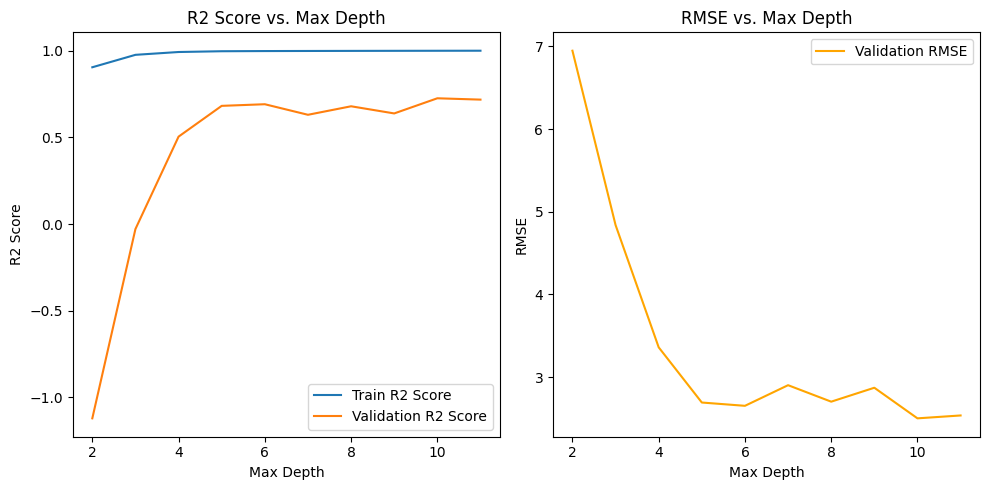

,Train R2 Score,Validation R2 Score,Validation RMSE
Depth,,,
4,0.992,0.504,3.360
5,0.996,0.681,2.693
6,0.997,0.691,2.653
7,0.998,0.630,2.903


In [7]:
"""
Modelo de árbol de decisión
"""

import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error as squared

# Initialize lists to store results
train_scores = []
val_scores = []
val_rmse = []

# Define the range of maximum depths to test
depths = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

# Iterate over different maximum depths
for d in depths:
    # Create the tree and fit it
    decision_tree = DecisionTreeRegressor(max_depth=d)
    decision_tree.fit(train_feature, train_target)

    # Calculate R2 scores on train and validation sets
    train_score = decision_tree.score(train_feature, train_target)
    val_score = decision_tree.score(val_feature, val_target)
    train_scores.append(train_score)
    val_scores.append(val_score)

    # Calculate RMSE on validation set
    val_rmse.append(squared(decision_tree.predict(val_feature), val_target, squared=False))

# Plotting the results
plt.figure(figsize=(10, 5))

# Plot R2 scores
plt.subplot(1, 2, 1)
plt.plot(depths, train_scores, label='Train R2 Score')
plt.plot(depths, val_scores, label='Validation R2 Score')
plt.xlabel('Max Depth')
plt.ylabel('R2 Score')
plt.title('R2 Score vs. Max Depth')
plt.legend()

# Plot RMSE
plt.subplot(1, 2, 2)
plt.plot(depths, val_rmse, label='Validation RMSE', color='orange')
plt.xlabel('Max Depth')
plt.ylabel('RMSE')
plt.title('RMSE vs. Max Depth')
plt.legend()

plt.tight_layout()
plt.savefig('../img/depth_DT.png')
plt.show()

# Define the depths of interest
depths_of_interest = [4, 5, 6, 7]

# Create an empty DataFrame to store the results
results_df = pd.DataFrame(columns=["Depth", "Train R2 Score", "Validation R2 Score", "Validation RMSE"])

# Iterate over the depths of interest
for depth in depths_of_interest:
    # Find the index of the depth in the list of all depths
    depth_index = depths.index(depth)
    
    # Add the results for the current depth to a temporary DataFrame
    temp_df = pd.DataFrame({
        "Depth": [depth],
        "Train R2 Score": [train_scores[depth_index]],
        "Validation R2 Score": [val_scores[depth_index]],
        "Validation RMSE": [val_rmse[depth_index]]
    })
    
    # Concatenate the temporary DataFrame with the main results DataFrame
    results_df = pd.concat([results_df, temp_df], ignore_index=True)
    
results_df = results_df.set_index("Depth")
results_df = results_df.round(3)
results_df

In [9]:
path=decision_tree.cost_complexity_pruning_path(train_feature, train_target)
alphas=path['ccp_alphas']

accuracy_train,accuracy_test=[],[]
for i in alphas:
    tree=DecisionTreeRegressor(ccp_alpha=i)

    tree.fit(train_feature, train_target)
    y_train_pred=tree.predict(train_feature)
    y_val_pred=tree.predict(val_feature)


    accuracy_train.append(squared(y_train_pred, train_target, squared=False))
    accuracy_test.append(squared(y_val_pred, val_target,squared=False))



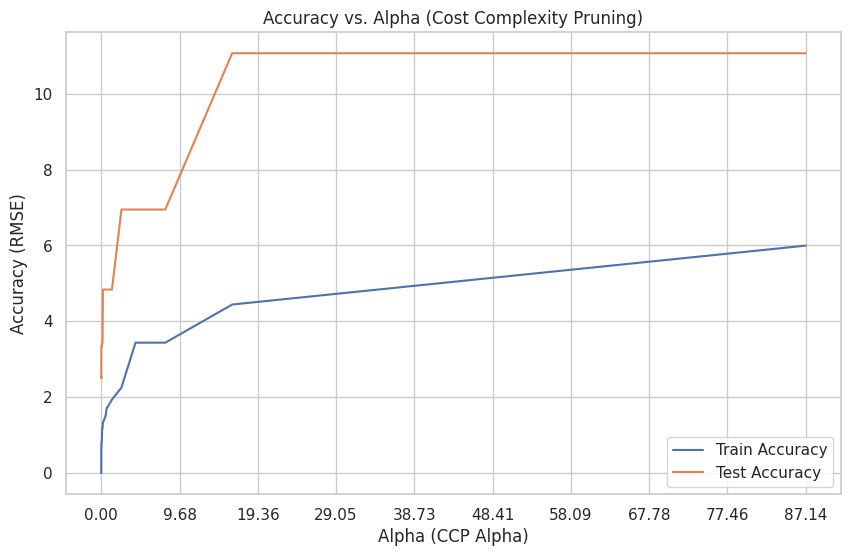

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define the number of divisions for the x-axis ticks
div = 10

# Set the style and size of the plot
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Plot the training accuracy
sns.lineplot(x=alphas, y=accuracy_train, label="Train Accuracy")

# Plot the test accuracy
sns.lineplot(x=alphas, y=accuracy_test, label="Test Accuracy")

# Set x-axis ticks
plt.xticks(np.linspace(alphas.min(), alphas.max(), div))

# Set labels and title
plt.xlabel("Alpha (CCP Alpha)")
plt.ylabel("Accuracy (RMSE)")
plt.title("Accuracy vs. Alpha (Cost Complexity Pruning)")

# Add legend
plt.legend()
plt.savefig('../img/alpha_DT.png')
# Show plot
plt.show()
